In [1]:
typedef ROOT::RDataFrame RDF;
TString dir0 = "/home/dlzhang/work/repos/TMSPlane/Software/Control/src";
TString dir1 = "/home/dlzhang/work/repos/TMSPlane/Software/Control/src/data/fpgaLin";
int nCh = 19;

In [2]:
%jsroot on

In [7]:
/// get data
TChain ch1("tree1");
ch1.Add(dir0+"/C3_tt3.root");
ch1.Show(0);

RDF d(ch1);
{
auto at = d.Count();
cout << at.GetValue() << endl;
}

======> EVENT:0
 tag             = 0
 T               = 1554627302
 adc             = 0.72525, 
                  0.724937, 0.724875, 0.724688, 0.724937, 0.725062, 
                  0.72475, 0.725062, 0.725062, 0.724875, 0.724937, 
                  0.724813, 0.724875, 0.725062, 0.725, 0.724437, 
                  0.72475, 0.724813, 0.724813, 0.724688
 ret             = -0.0593112, 
                  -1.19985, -1.33062, -0.503489, -0.193789, -1.32284, 
                  0.0032942, -0.145901, -1.23671, -3.32955, -0.280387, 
                  -2.10238, -1.02696, -0.176771, -1.29698, -0.344764, 
                  -0.197586, -0.431414, -0.68249, -7.92196
 par             = 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0
 val             = 0, 
                  -0.000204731, -0.000236128, -0.000197851, -0.000233691, -0.000221639, 
                  -0.00016886, -0.000108305, 0.00037397, 0.0001481, 0.0001

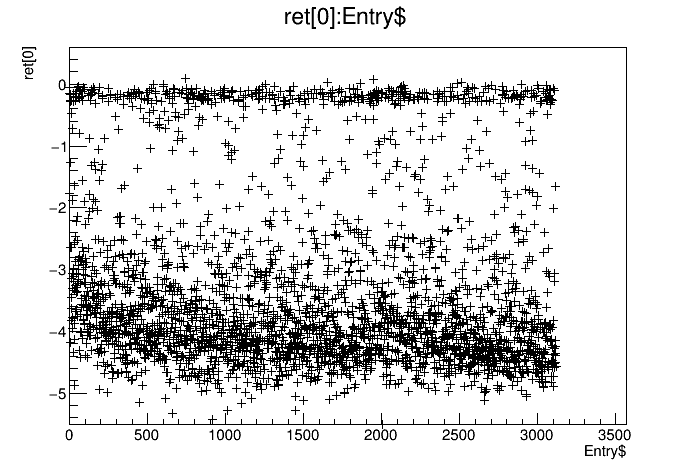

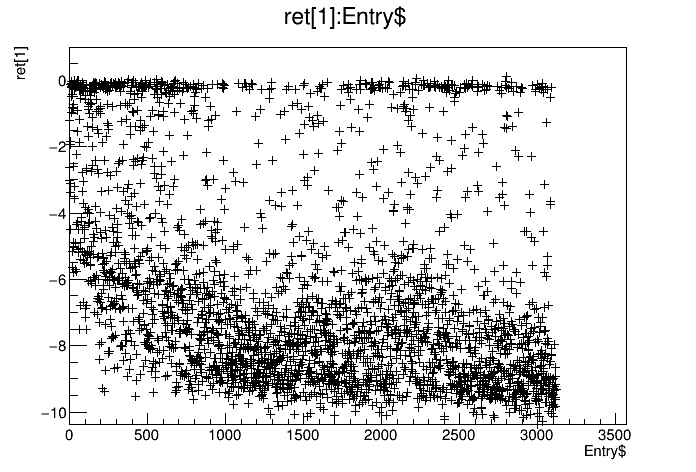

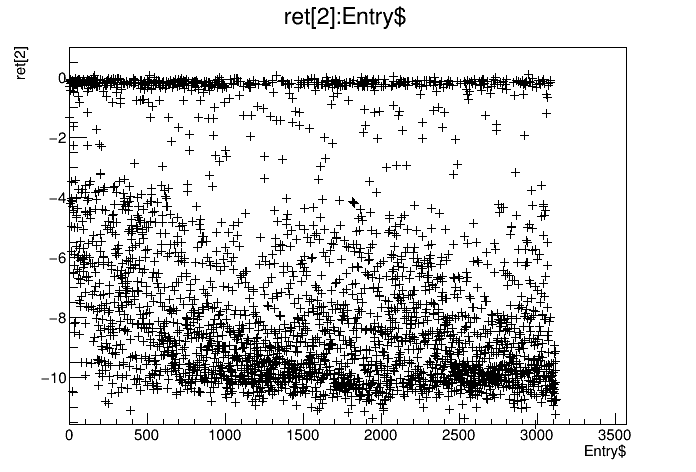

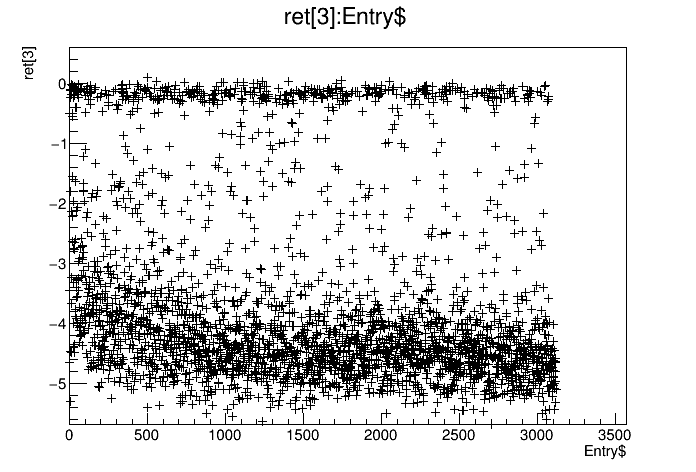

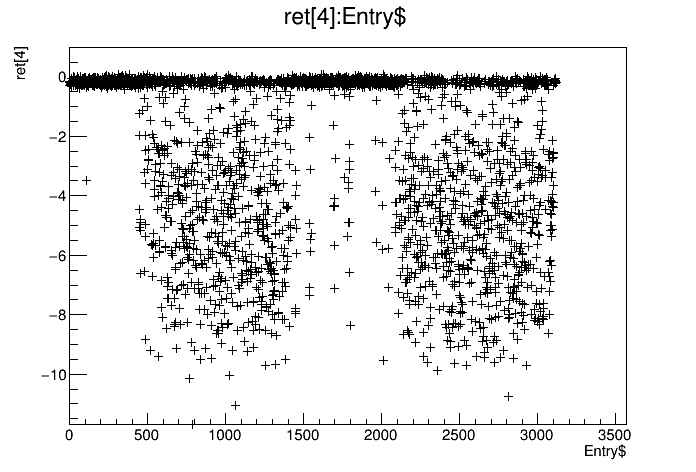

...

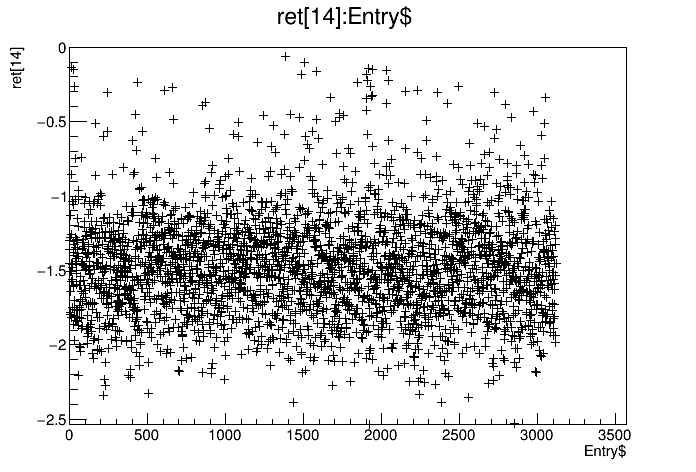

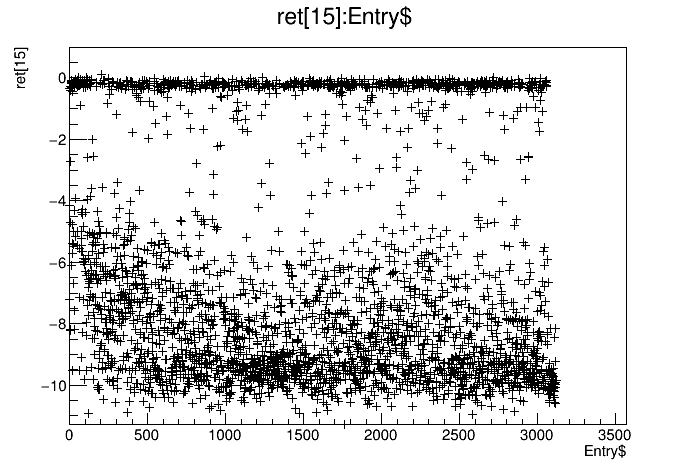

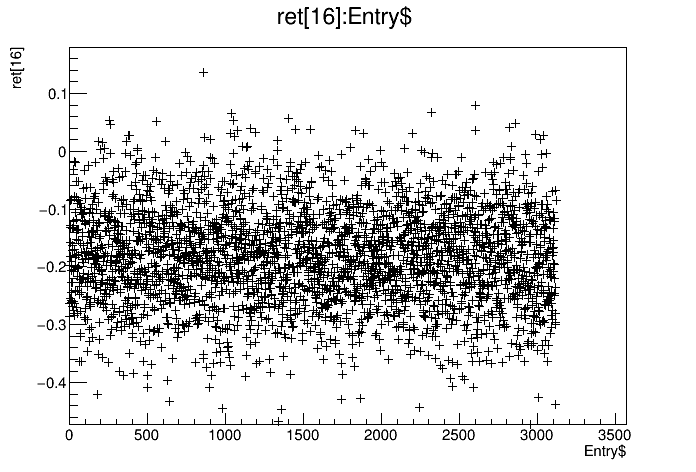

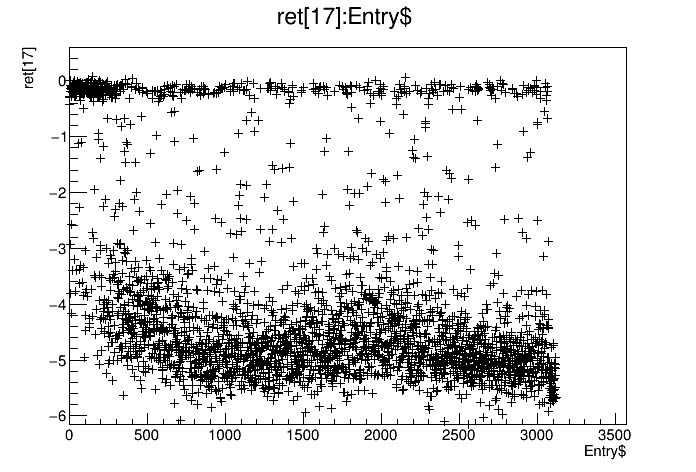

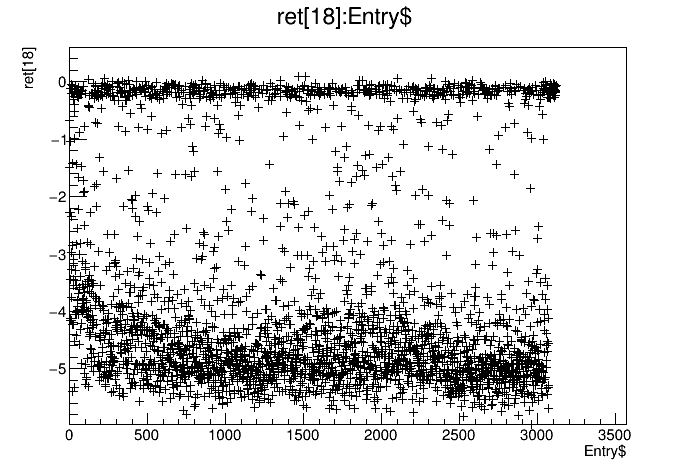

In [8]:
for(int i=0; i<nCh; i++){
auto cx = new TCanvas();
ch1.SetMarkerStyle(2);
ch1.Draw(TString::Format("ret[%d]:Entry$", i));
cx->Draw();
}

In [ ]:
///// check the parameters of the best 100 points
//#include <type_traits> // std::is_same
//#include <utility>
{
    int n1 = ch1.Draw("ret[0]","","goff");
    auto var1 = ch1.GetV1();
    int idx[n1];
    TMath::Sort(n1, var1, idx, false);
    cout << n1 << " " << idx[0] << " " << var1[idx[0]] << endl;
    cout << n1 << " " << idx[200] << " " << var1[idx[200]] << endl;
}

In [ ]:
float checkChan_t8(TChain& ch, int chan, int topN=100){
    int n1 = ch.Draw(TString::Format("ret[%d]",chan),"","goff");
    auto var1 = ch.GetV1();
    int idx[n1];
    TMath::Sort(n1, var1, idx, false);
    auto floatL = var1[idx[topN]];

    ch.SetMarkerColor(1);
    ch.Draw("par[0][0]:par[0][1]");
    ch.SetMarkerColor(2);
    ch.Draw("par[0][0]:par[0][1]",TString::Format("ret[0]<%.2f",floatL),"same");
    gPad->Draw();
    return 0;
}

checkChan_t8(ch1, 0);

In [ ]:
ch1.Draw("ret[0]:par[0][0]");
gPad->Draw();

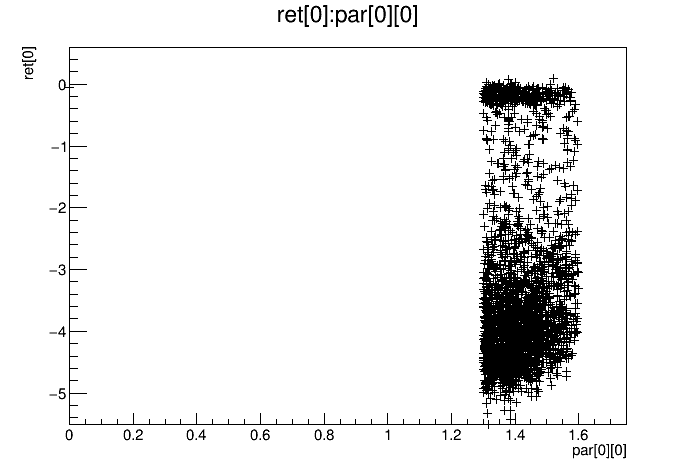

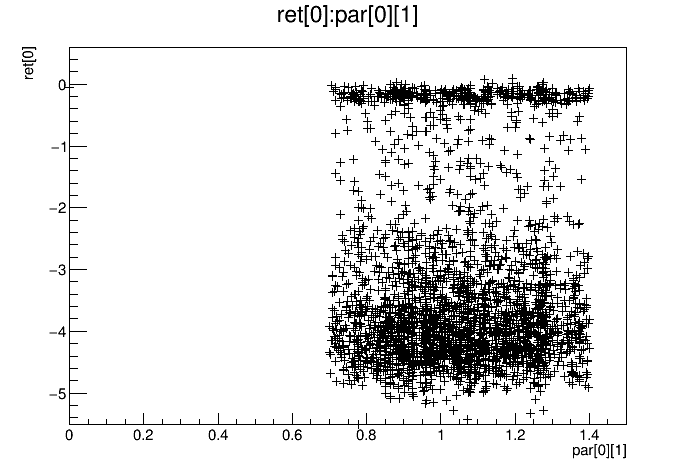

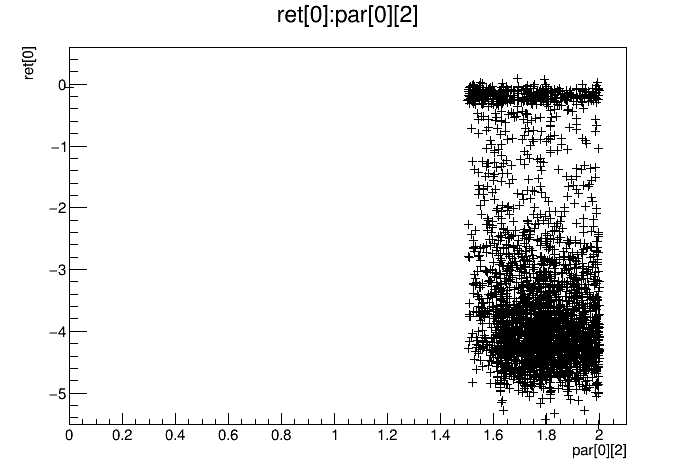

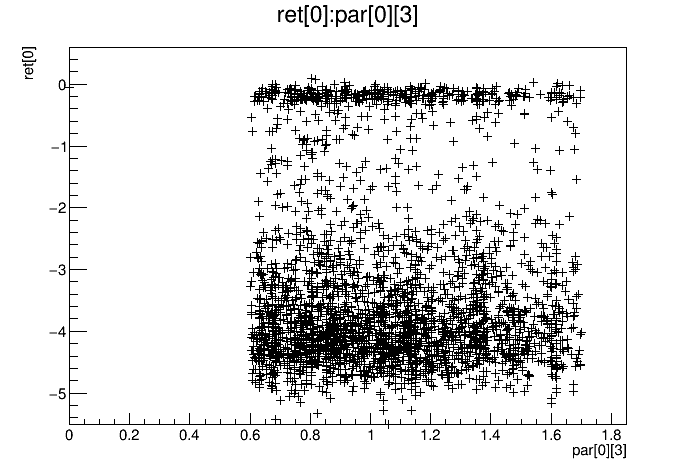

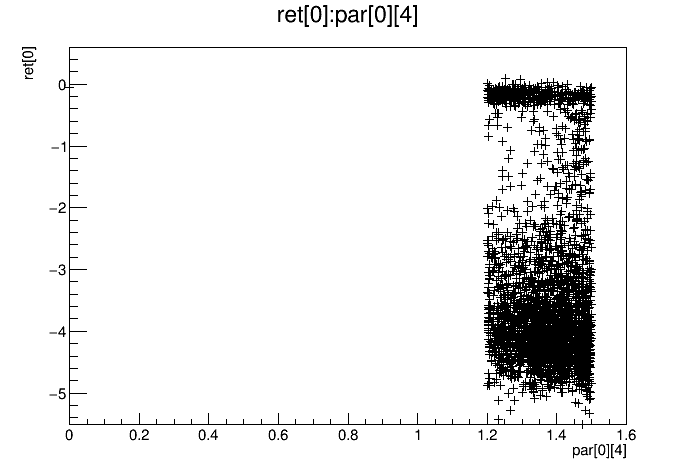

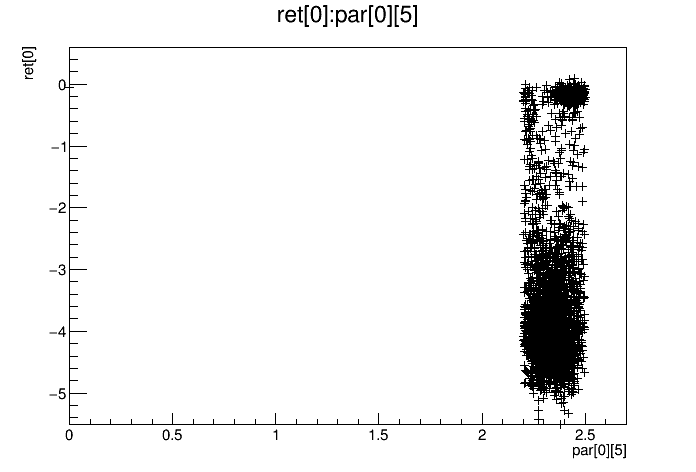

In [10]:
void chechPar(TChain& ch, int chan){
    for(int ii=0; ii<6; ii++){
       auto cx = new TCanvas(TString::Format("chan_%d_p_%d",chan, ii));
       ch.Draw(TString::Format("ret[%d]:par[%d][%d]", chan, chan, ii));
       cx->Draw();
    }
    return;
}
chechPar(ch1, 0);

In [ ]:
void chechPar_i(TChain& ch, int chan, int ipar){
    auto cx = new TCanvas(TString::Format("chan_%d_p_%d",chan, ipar));
    ch.Draw(TString::Format("ret[%d]:par[%d][%d]", chan, chan, ipar));
    cx->Draw();
    return;
}

In [ ]:
{
    for(int i=0; i<19; i++)
    chechPar(ch1, i);
}

In [ ]:
void chechParx_1(TChain& ch){
    for(int ii=0; ii<6; ii++){
        for(int chan=0; chan<19; chan++){
          auto cx = new TCanvas(TString::Format("chan_%d_p_%d",chan, ii));
          ch.Draw(TString::Format("ret[%d]:par[%d][%d]", chan, chan, ii));
          cx->Draw();
        }
    }
    return;
}
chechParx_1(ch1);

In [ ]:
ch1.Draw("par[0][0]");
ch1.Draw("par[0][0]","ret[0]<-4","same PLC");
gPad->Draw();

## Check the validation

In [ ]:
//{
TChain ch_t3_v1("tree1");
ch_t3_v1.Add(dir0+"/C3_tt3_valid1.root");
ch_t3_v1.Show(0);
//}

In [ ]:
for(int i=0;i<nCh;i++){
 auto c = new TCanvas(TString::Format("cav_%d",i));
 c->cd();
 ch_t3_v1.Draw(TString::Format("val[%d]:tag",i));
 c->Draw();
}

In [ ]:
ch_t3_v1.Draw("val[0]","tag==1");
ch_t3_v1.Draw("val[0]","tag==2","PCL same");
gPad->Draw();

In [ ]:
float get_ENC_v1(TChain& ch, int chan, int tag, float norm=-1, bool draw=false){
    float ENC = -1;
   // cout << "xxxxx" << endl;
    ch.Draw(TString::Format("val[%d]",chan),TString::Format("tag==%d",tag),"goff");
    auto* h1 = (TH1F*)gDirectory->Get("htemp");
    h1->Fit("gaus");
    auto* fun1 = h1->GetFunction("gaus");
    
    if(draw){
      h1->Draw();
      gPad->Draw();
     }
    if(fun1) {
      ENC = fun1->GetParameter(2);
      if (norm>0) ENC *= norm/fun1->GetParameter(1);
     }
    return ENC;
}

//;cout << get_ENC(ch_t3_v1, 9, 3, 741*0.5) << endl;

In [ ]:
{
    auto gr = new TGraphErrors();
    for(int i=-1; i<10; i++){
        auto e = get_ENC(ch_t3_v1, 15, i, 741*0.5);
        //float e = 0.3;
        cout << i << " " << e << endl;
        gr->SetPoint(i+1, i, e);
    }
    
    auto cx = new TCanvas();
    cout << "pppp" << endl;
    gr->Draw();
    cx->Draw();
}

In [ ]:
{
    auto gr = new TGraphErrors();
    for(int i=-1; i<10; i++){
        auto e = get_ENC(ch_t3_v1, 15, i, 741*0.5);
        //float e = 0.3;
        cout << i << " " << e << endl;
        gr->SetPoint(i+1, i, e);
    }
    
    auto cx = new TCanvas();
    cout << "pppp" << endl;
    gr->Draw();
    cx->Draw();
}

In [ ]:
{
auto& ch = ch_t3_v1;
int chan = 9;
int tag = 3;
ch.Draw(TString::Format("val[%d]",chan),TString::Format("tag==%d",tag));
cout << "ttt" << endl;
auto* h1 = (TH1F*)(gPad->GetPrimitive("htemp"));
h1->Fit("gaus");
gPad->Draw();
}

# Check ENC

In [ ]:
//{
    TTree t1;
    t1.ReadFile(dir0+"/C3_valid1_out.ttl");
    t1.Show(0);
    
    gStyle->SetMarkerStyle(20);
//}

In [ ]:
%jsroot off

In [ ]:
    t1.Draw("status","","");
    gPad->Draw();

In [ ]:
    t1.Draw("log(prob)","","");
    gPad->Draw();

In [ ]:
gStyle->SetMarkerStyle(25);
t1.Draw("Mean:A","","colz");
gPad->Draw();

In [ ]:
gStyle->SetMarkerStyle(25);
t1.Draw("RMS:sig","","colz");
gPad->Draw();

In [ ]:
t1.Scan("ch:tag:prob:RMS:sig:RMS/sig-1","abs(RMS/sig-1)>0.1")

In [ ]:
gStyle->SetOptFit(1111);
cout << get_ENC_v1(ch_t3_v1, 4, 4, 741*0.5, true) << endl;

In [ ]:
cout << get_ENC_v1(ch_t3_v1, 4, 9, 741*0.5, true) << endl;

In [ ]:
gStyle->SetOptStat(0);
t1.Draw("enc:ch:tag","enc<300","prof colz");
gPad->Draw();

In [ ]:
t1.Scan("enc:ch:tag","enc<150");

In [ ]:
cout << get_ENC_v1(ch_t3_v1, 3, 5, 741*0.5, true) << endl;

### Tune Test 4
Using 0.2 V pulse

In [3]:
/// get data
TChain ch5("tree1");
ch5.Add(dir0+"/C3_tt5.root");
ch5.Show(0);

RDF d5(ch5);
{
auto at = d5.Count();
cout << at.GetValue() << endl;
}

======> EVENT:0
 tag             = 0
 T               = 1555248087
 adc             = 0.723688, 
                  0.723938, 0.72325, 0.723063, 0.722938, 0.723437, 
                  0.72375, 0.723688, 0.723938, 0.723938, 0.723625, 
                  0.723875, 0.723437, 0.72325, 0.723188, 0.723625, 
                  0.723813, 0.72375, 0.723375, 0.723437
 ret             = -2.11033, 
                  -2.08339, -2.07596, -2.05145, -2.05493, -2.10353, 
                  -2.03683, -0.293829, -2.1448, -2.29315, -1.27441, 
                  -2.08557, -2.09157, -1.01351, -2.10845, -2.00879, 
                  -1.30594, -2.02418, -2.00552, -5.84694
 par             = 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0
 val             = 0.00600585, 
                  0.00578135, 0.00560281, 0.00569614, 0.00583526, 0.00579083, 
                  0.00566018, 0.00579168, 0.0311957, 0.0303094, 0.0305364, 
        

In [4]:
%jsroot off

In [ ]:
for(int i=0; i<nCh; i++){
auto cx = new TCanvas();
ch5.SetMarkerStyle(2);
ch5.Draw(TString::Format("ret[%d]:Entry$", i));
cx->Draw();
}

Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_0
Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_1
Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_2
Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_3
Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_4
Warning in <TCanvas::Constructor>: Deleting canvas with same name: chan_0_p_5


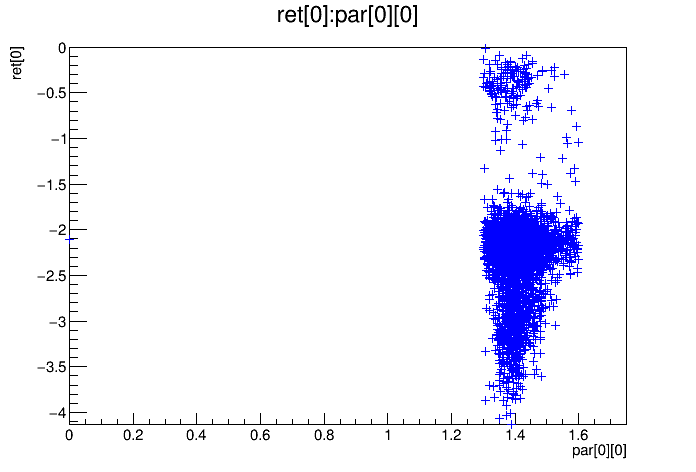

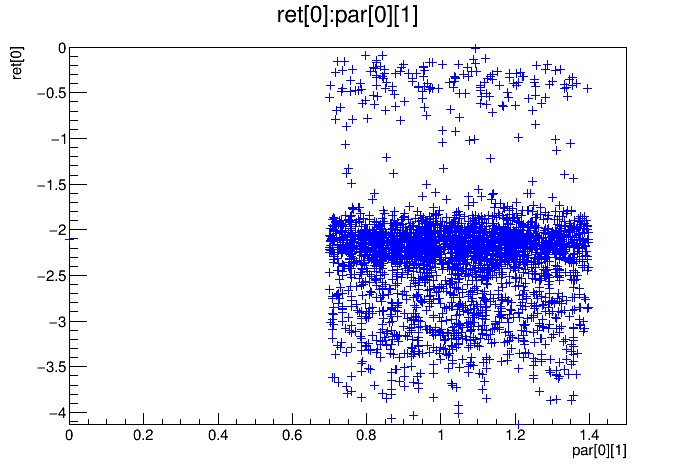

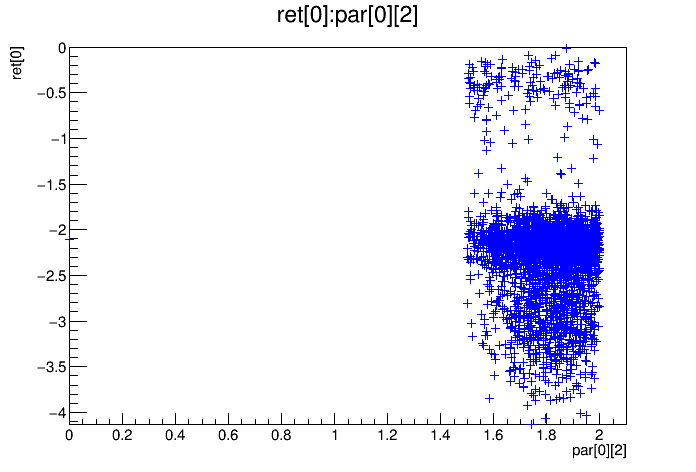

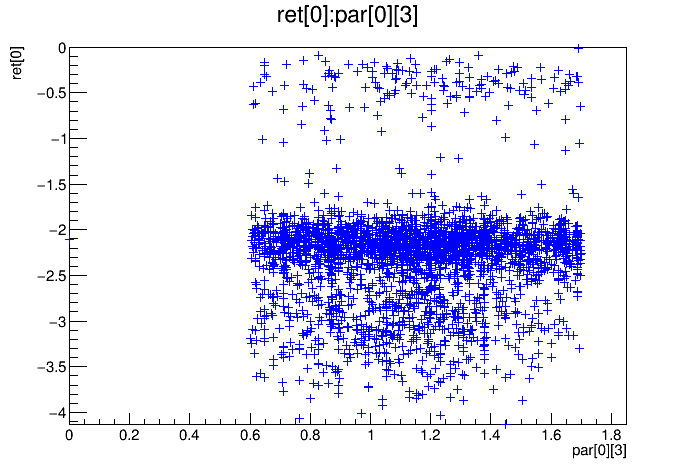

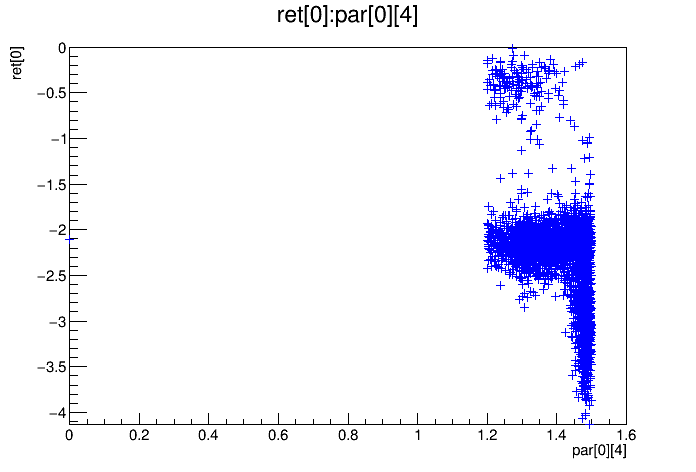

...

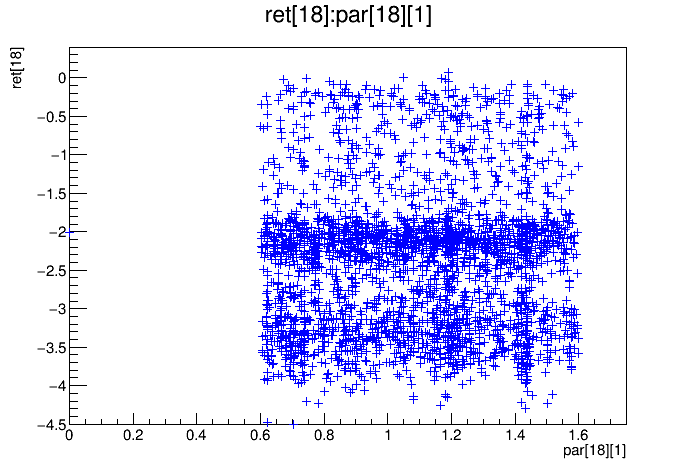

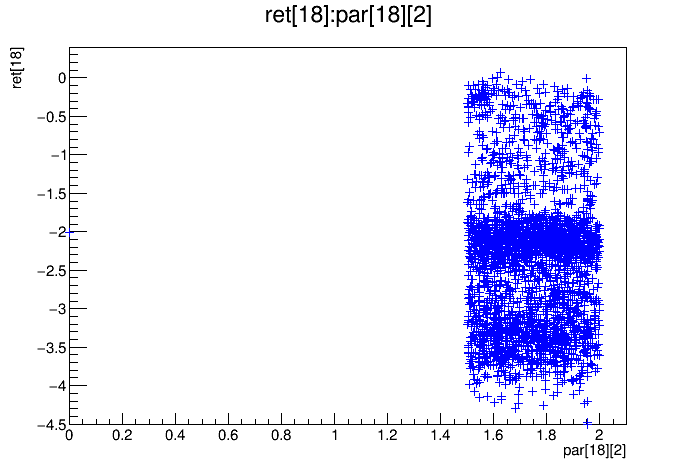

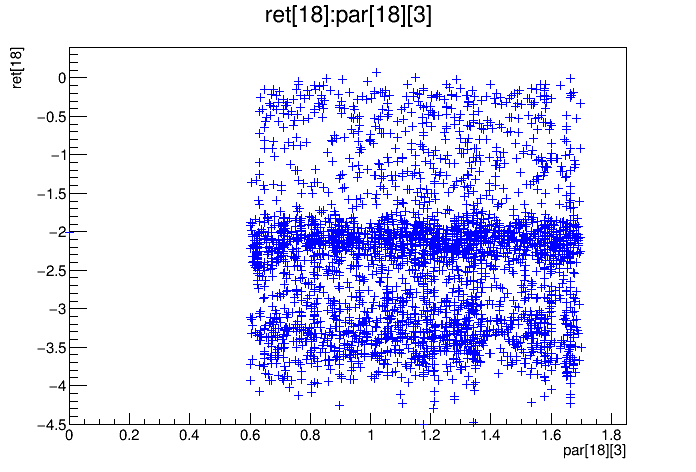

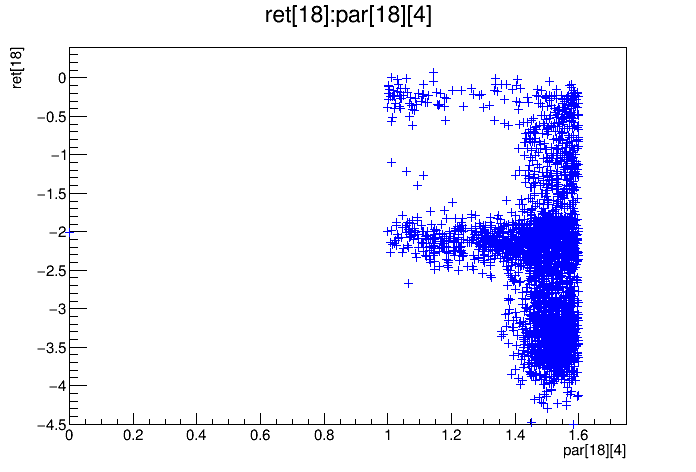

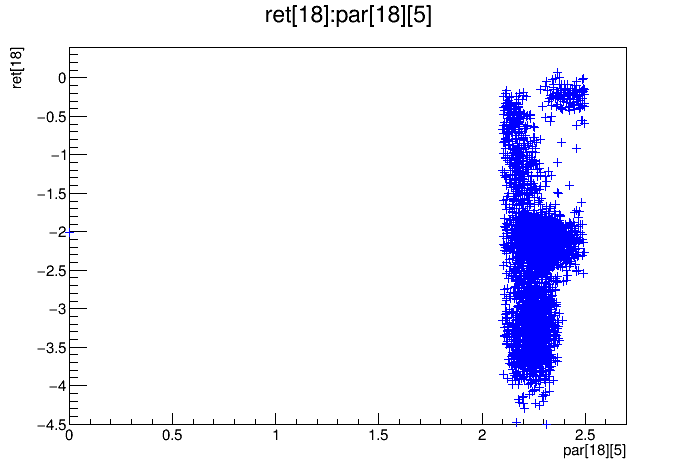

In [11]:
{
    ch5.SetMarkerStyle(2);
    ch5.SetMarkerColor(4);
    for(int i=0; i<19; i++)
    chechPar(ch5, i);
}

In [ ]:
{
  for(int i=0; i<nCh; i++) chechPar_i(ch5, i, 4);
}

## Check the M6

In [2]:
/// get data
TChain ch6("tree1");
ch6.Add(dir0+"/C3_tt6.root");
ch6.Show(0);

RDF d6(ch6);
{
auto at = d6.Count();
cout << at.GetValue() << endl;
}

======> EVENT:0
 tag             = 0
 T               = 1555658503
 adc             = 0.724813, 
                  0.7245, 0.724688, 0.724563, 0.7245, 0.724688, 
                  0.724375, 0.724312, 0.7245, 0.725438, 0.724688, 
                  0.724375, 0.724125, 0.724437, 0.724625, 0.724813, 
                  0.724375, 0.724688, 0.724187, 0.72475
 ret             = -28.4858, 
                  -40.4956, -1.75745, -31.551, -15.3684, -37.9162, 
                  -30.9395, -0.207222, -35.0455, -0.383947, -0.586239, 
                  -16.4197, -2.07161, -0.430974, -13.0772, -3.65524, 
                  -2.85826, -5.85168, -1.33302, -17.8136
 par             = 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0, 0, 
                  0, 0, 0, 0
 val             = 0.0061831, 
                  0.00591559, 0.00586643, 0.00605913, 0.00567704, 0.00595186, 
                  0.00554985, 0.00586612, 0.0296152, 0.0293029, 0.0286757, 
         

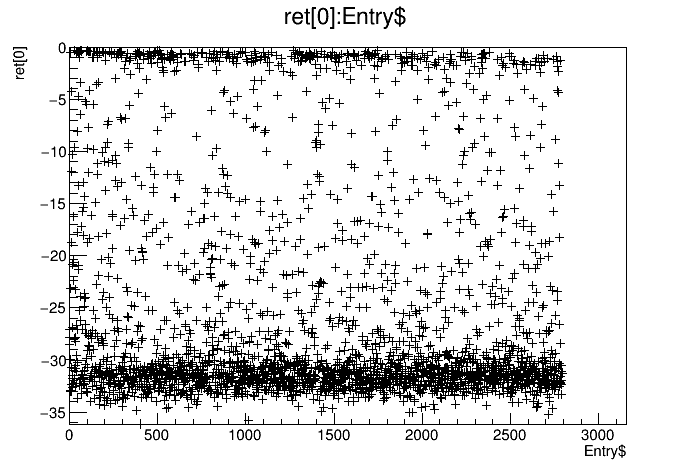

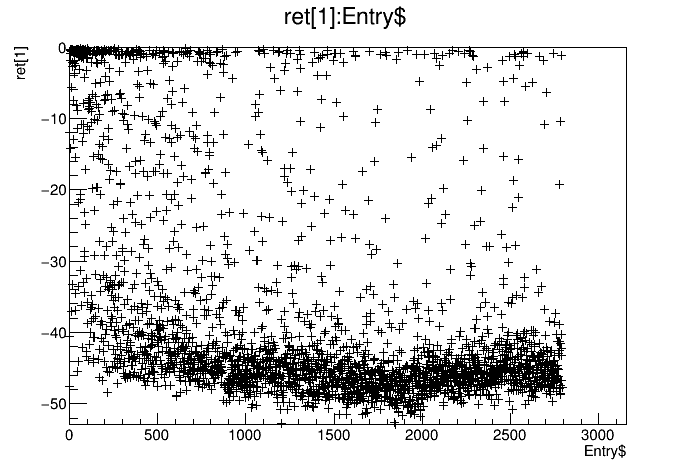

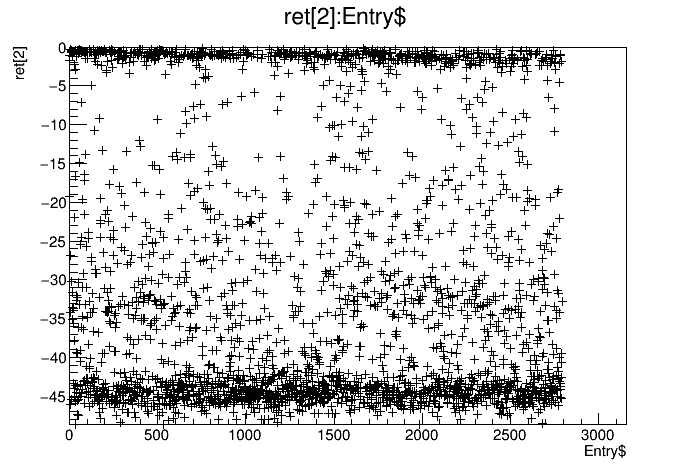

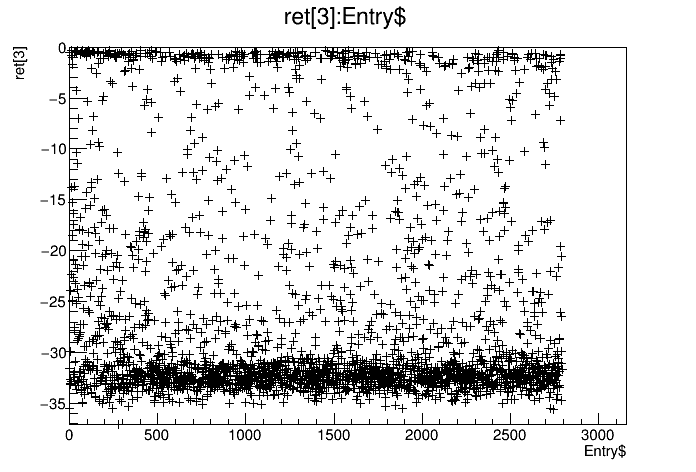

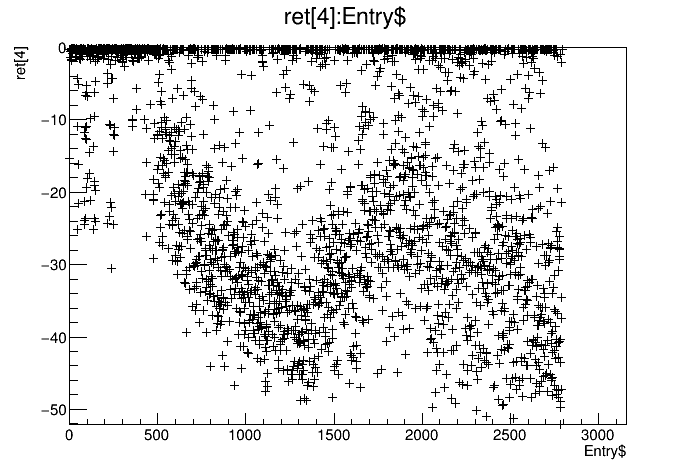

...

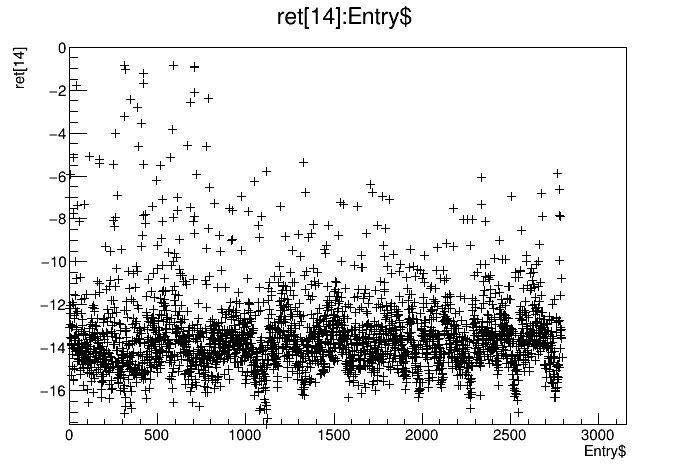

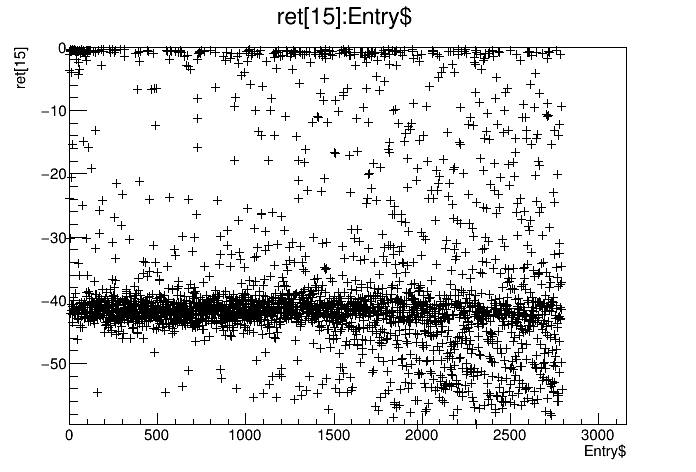

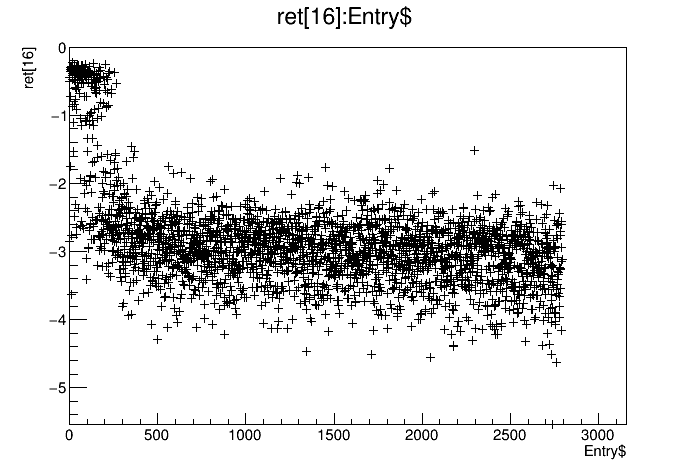

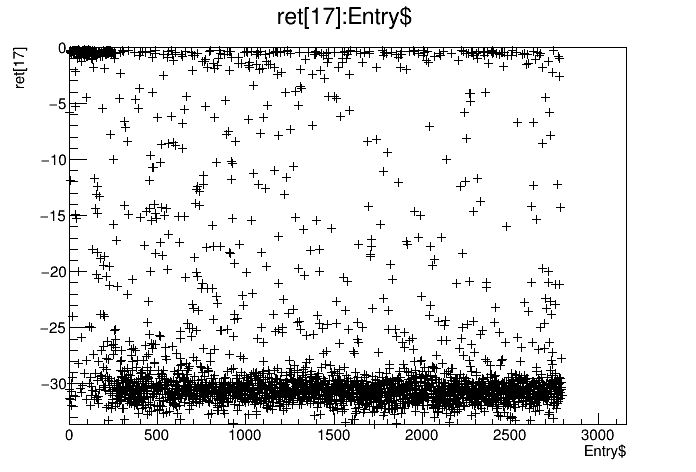

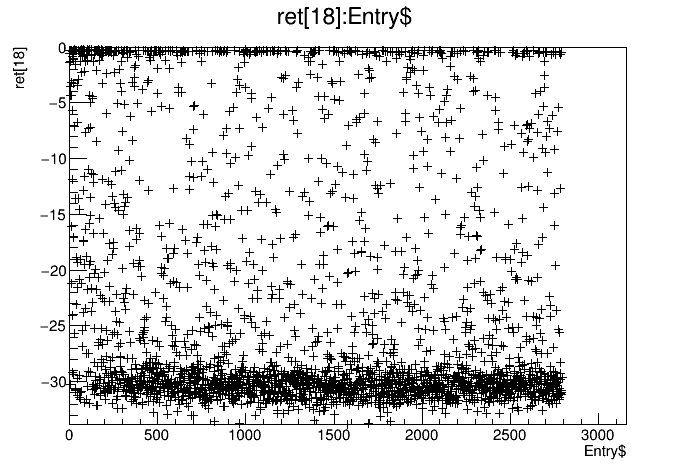

In [3]:
for(int i=0; i<nCh; i++){
auto cx = new TCanvas();
ch6.SetMarkerStyle(2);
ch6.Draw(TString::Format("ret[%d]:Entry$", i));
cx->Draw();
}

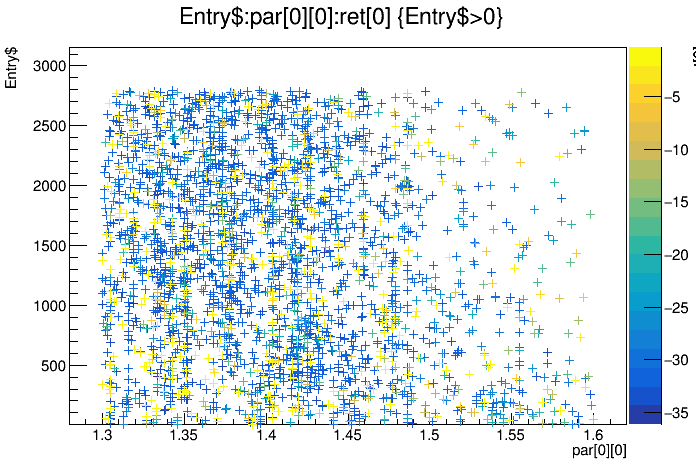

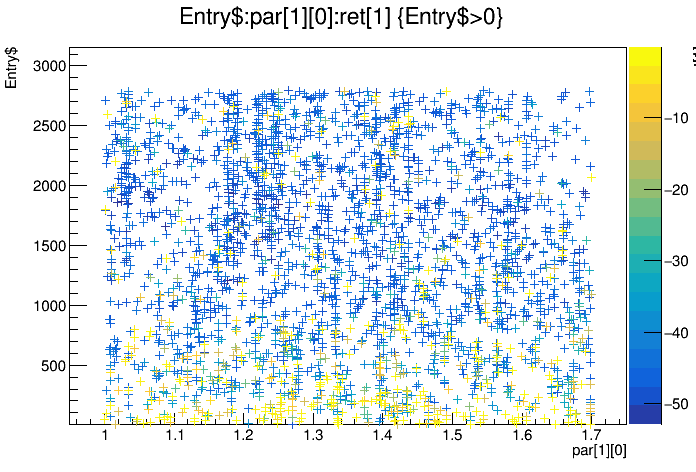

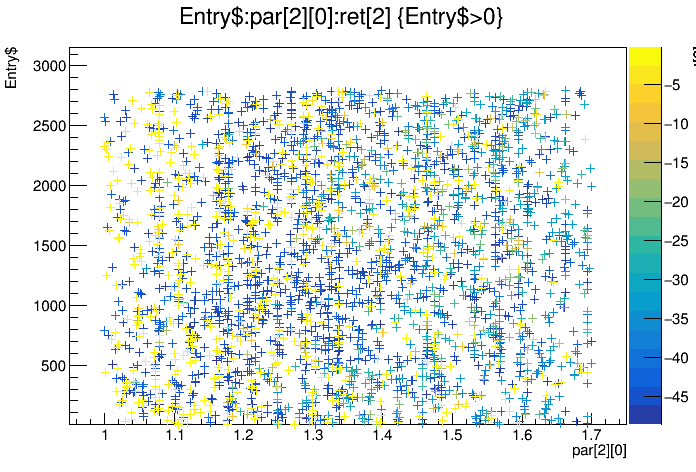

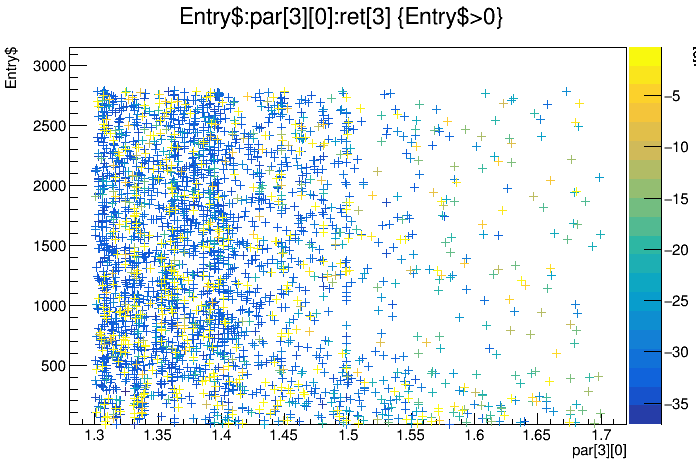

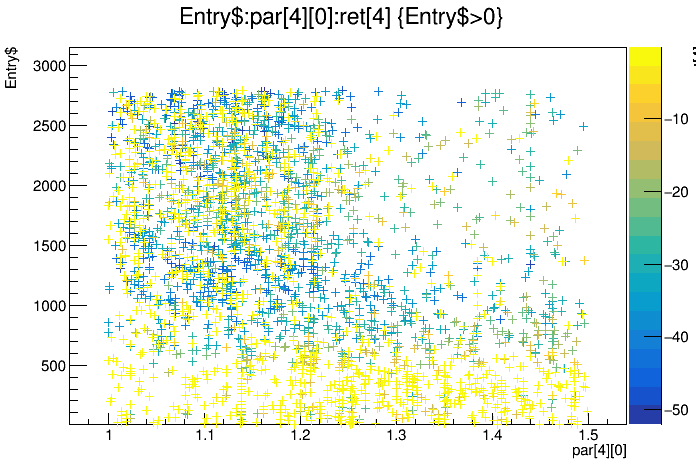

...

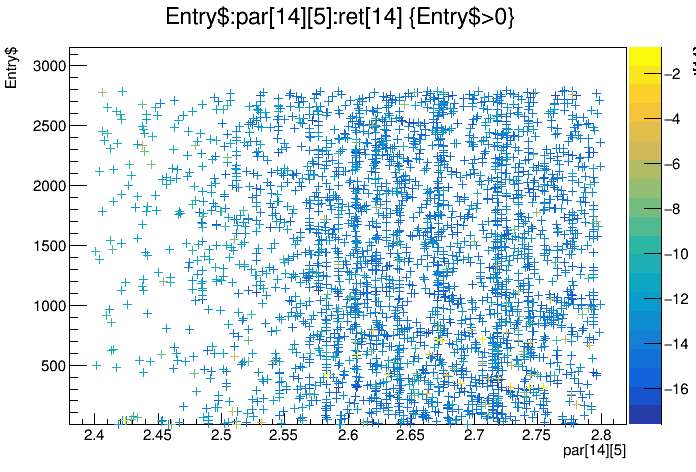

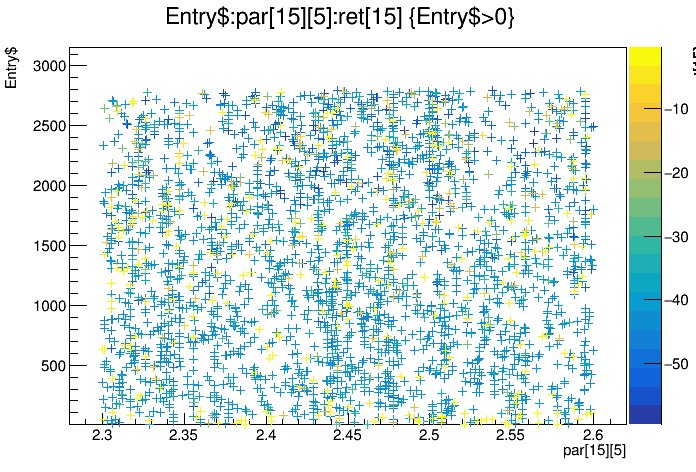

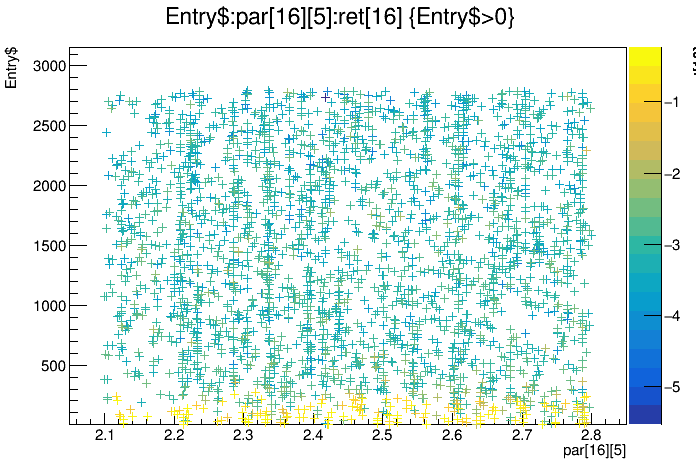

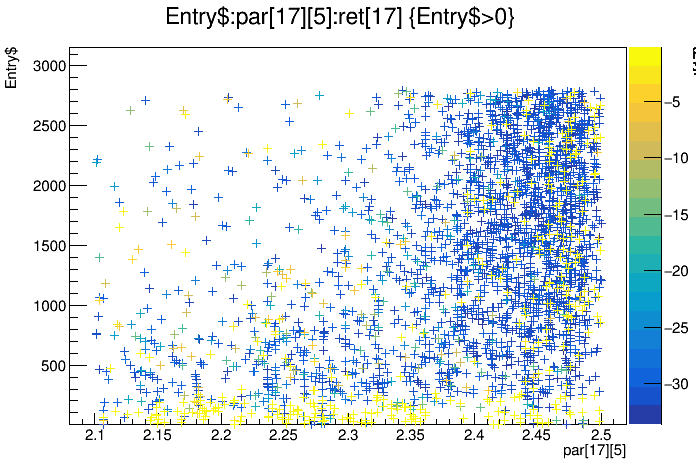

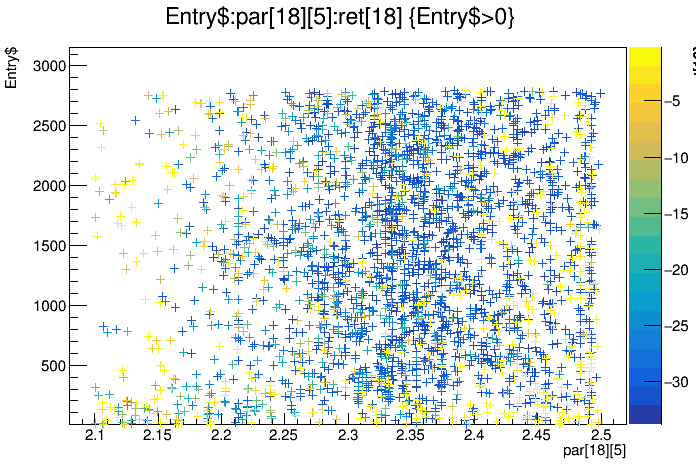

In [4]:
{
    auto& ch = ch6;
//    ch.Draw(TString::Format("Entry$:par[%d][%d]:ret[%d]", 0, 0, 4),"Entry$>0","colz");
//    gPad->Draw();
    
    for(int ii=0; ii<6; ii++){
        for(int chan=0; chan<19; chan++){
          auto cx = new TCanvas(TString::Format("chan_%d_p_%d",chan, ii));
          ch.Draw(TString::Format("Entry$:par[%d][%d]:ret[%d]", chan,ii, chan), "Entry$>0","colz");
          //ch.Draw(TString::Format("ret[%d]:par[%d][%d]", chan, chan, ii));
          cx->Draw();
        }
    }
}